In [326]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import plotly.graph_objects as go
import plotly.express as px 
from plotly.subplots import make_subplots
from scipy import stats
import statsmodels.api as sm
import warnings
from itertools import product
from datetime import datetime
warnings.filterwarnings('ignore')
from plotly import tools
import plotly.figure_factory as ff
import plotly.graph_objs as go
init_notebook_mode(connected=True)
from chart_studio.plotly import *

import time
import copy
import chainer
import chainer.functions as F
import chainer.links as L
from plotly import tools
from plotly.offline import init_notebook_mode, iplot, iplot_mpl
init_notebook_mode()

from random import randint
import plotly.graph_objects as go
import plotly.figure_factory as ff
from itertools import product
import statsmodels.api as sm
from tqdm import tqdm
from imblearn.over_sampling import SMOTENC
from lightgbm import LGBMClassifier

from sklearn.decomposition import PCA
from sklearn.neural_network import MLPClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.model_selection import StratifiedKFold,KFold
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestRegressor , AdaBoostClassifier, RandomForestClassifier, BaggingClassifier, GradientBoostingClassifier,VotingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTENC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn.metrics import f1_score
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier,XGBRegressor
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.linear_model import LinearRegression,Ridge,Lasso,RidgeClassifier, RidgeClassifierCV
from sklearn.metrics import mean_squared_error
from sklearn.metrics import classification_report,precision_recall_curve
import tensorflow as tf
from tensorflow import keras
from keras.callbacks import TensorBoard
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input, Conv2D, MaxPool2D,MaxPooling2D, UpSampling2D,Flatten
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from keras.utils import plot_model
from keras.models import load_model, Model
from tensorflow.keras.utils import to_categorical
from keras.models import Sequential
from tensorflow.keras.optimizers.legacy import Adam, SGD
from tensorflow.keras.optimizers import Adam, SGD
from subprocess import check_output
import warnings
warnings.filterwarnings('ignore')


plt.rcParams['figure.figsize'] = (5,3)
plt.rcParams["figure.dpi"] = 120

In [327]:
b = pd.read_excel('C:/Users/Mua/Downloads/Compressed/bank-full.xlsx')
b

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [110]:
b.describe(percentiles=[0.1, 0.25, 0.75, 0.9, 0.95]).T.apply(lambda x: x.apply("{0:.3f}".format))

,count,mean,std,min,10%,25%,50%,75%,90%,95%,max
age,45211.000,40.936,10.619,18.000,29.000,33.000,39.000,48.000,56.000,59.000,95.000
balance,45211.000,1362.272,3044.766,-8019.000,0.000,72.000,448.000,1428.000,3574.000,5768.000,102127.000
day,45211.000,15.806,8.322,1.000,5.000,8.000,16.000,21.000,28.000,29.000,31.000
duration,45211.000,258.163,257.528,0.000,58.000,103.000,180.000,319.000,548.000,751.000,4918.000
campaign,45211.000,2.764,3.098,1.000,1.000,1.000,2.000,3.000,5.000,8.000,63.000
pdays,45211.000,40.198,100.129,-1.000,-1.000,-1.000,-1.000,-1.000,185.000,317.000,871.000
previous,45211.000,0.580,2.303,0.000,0.000,0.000,0.000,0.000,2.000,3.000,275.000


In [111]:
def check(b):
    l=[]
    columns=b.columns
    for col in columns:
        dtypes=b[col].dtypes
        nunique=b[col].nunique()
        sum_null=b[col].isnull().sum()
        l.append([col,dtypes,nunique,sum_null])
    b_check=pd.DataFrame(l)
    b_check.columns=['column','dtypes','nunique','sum_null']
    return b_check
check(b)

,column,dtypes,nunique,sum_null
0,age,int64,77,0
1,job,object,12,0
2,marital,object,3,0
3,education,object,4,0
4,default,object,2,0
5,balance,int64,7168,0
6,housing,object,2,0
7,loan,object,2,0
8,contact,object,3,0
9,day,int64,31,0


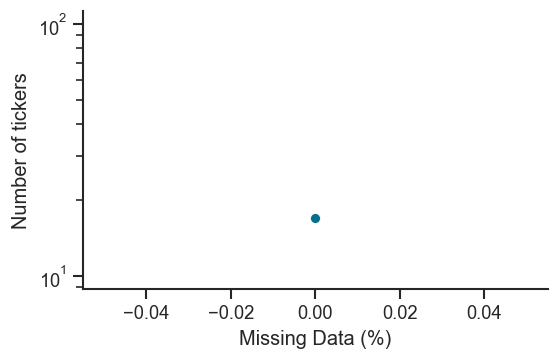

In [112]:
percent_missing = pd.DataFrame(b.isnull().sum() * 100 / len(b))
percent_missing.columns = ['percent_missing']
percent_missing.sort_values('percent_missing', inplace=True, ascending=False)

percent_missing_plot = pd.DataFrame(percent_missing.reset_index().groupby('percent_missing').size())
percent_missing_plot.reset_index(inplace=True)
percent_missing_plot.columns = ['percent_missing', 'count']

ax = sns.scatterplot(x='percent_missing', y='count', data=percent_missing_plot, color=greek_salad[2])
ax.set_yscale('log')
ax.set_ylabel('Number of tickers')
ax.set_xlabel('Missing Data (%)')
sns.despine()

OBJECT TYPE

╔═══════════════════════════════════════════════════════╗
║                          JOB                          ║
╚═══════════════════════════════════════════════════════╝

╔══════════════════════════════════════════╗
║ There are 12 unique values in JOB column ║
╚══════════════════════════════════════════╝


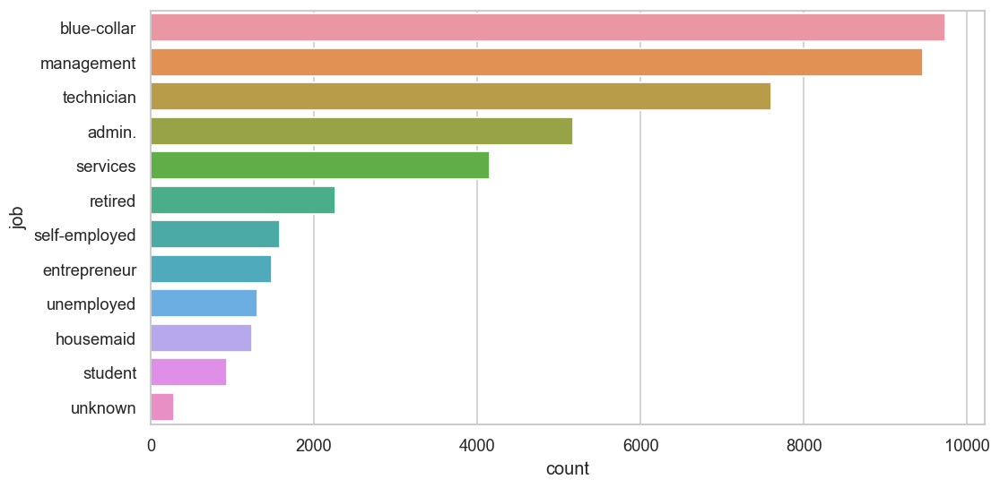


╔═══════════════════════════════════════════════════════════╗
║                          MARITAL                          ║
╚═══════════════════════════════════════════════════════════╝

╔═════════════════════════════════════════════╗
║ There are 3 unique values in MARITAL column ║
╚═════════════════════════════════════════════╝


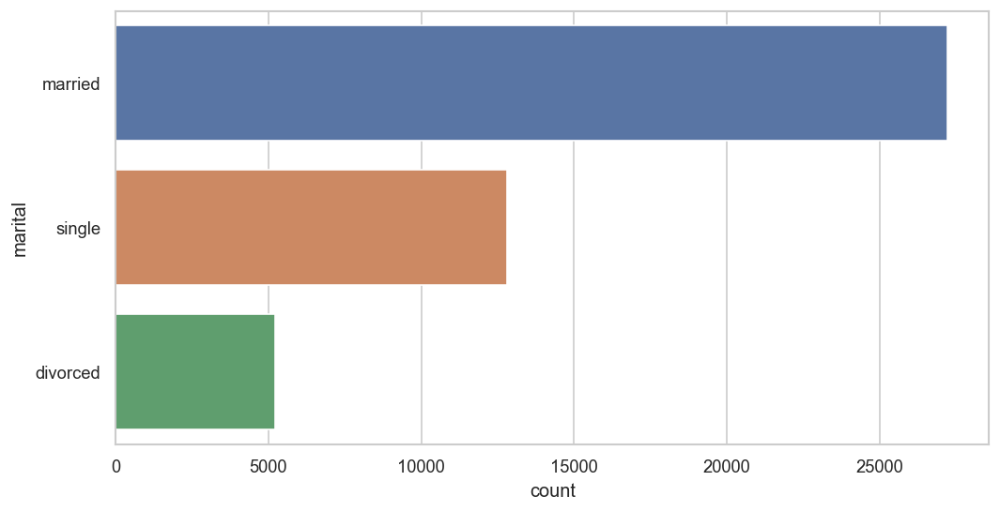


╔═════════════════════════════════════════════════════════════╗
║                          EDUCATION                          ║
╚═════════════════════════════════════════════════════════════╝

╔═══════════════════════════════════════════════╗
║ There are 4 unique values in EDUCATION column ║
╚═══════════════════════════════════════════════╝


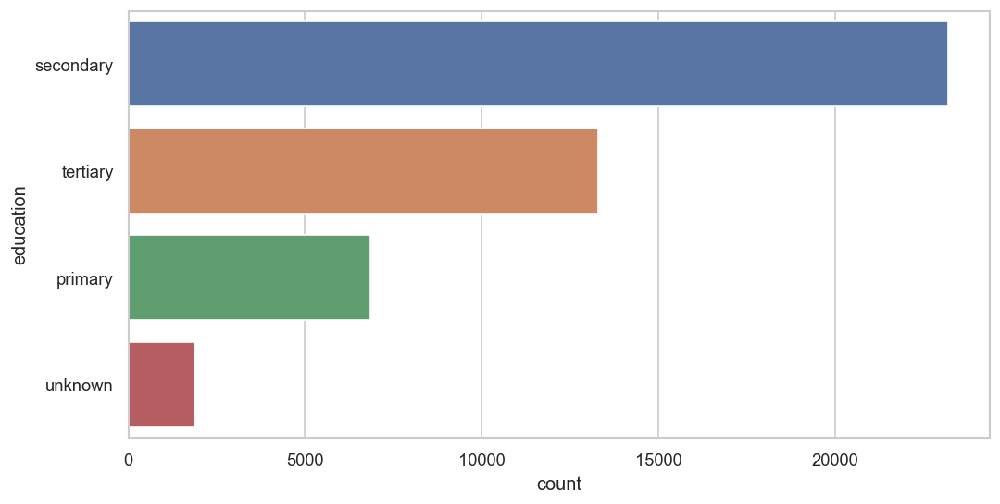


╔═══════════════════════════════════════════════════════════╗
║                          DEFAULT                          ║
╚═══════════════════════════════════════════════════════════╝

╔═════════════════════════════════════════════╗
║ There are 2 unique values in DEFAULT column ║
╚═════════════════════════════════════════════╝


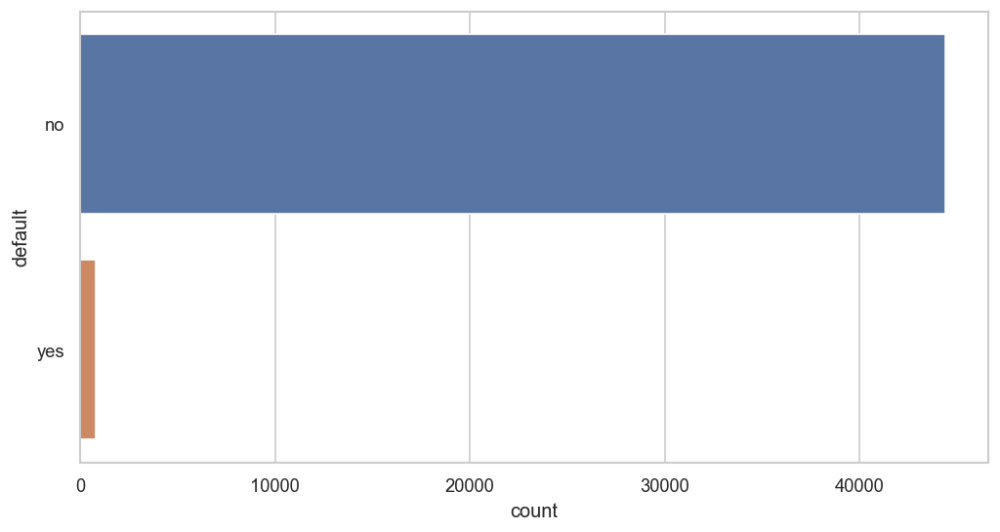


╔═══════════════════════════════════════════════════════════╗
║                          HOUSING                          ║
╚═══════════════════════════════════════════════════════════╝

╔═════════════════════════════════════════════╗
║ There are 2 unique values in HOUSING column ║
╚═════════════════════════════════════════════╝


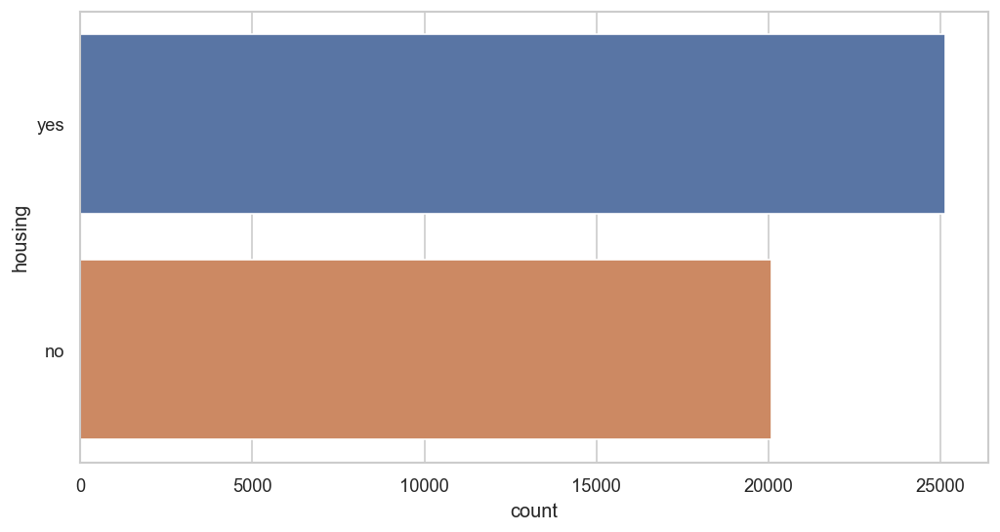


╔════════════════════════════════════════════════════════╗
║                          LOAN                          ║
╚════════════════════════════════════════════════════════╝

╔══════════════════════════════════════════╗
║ There are 2 unique values in LOAN column ║
╚══════════════════════════════════════════╝


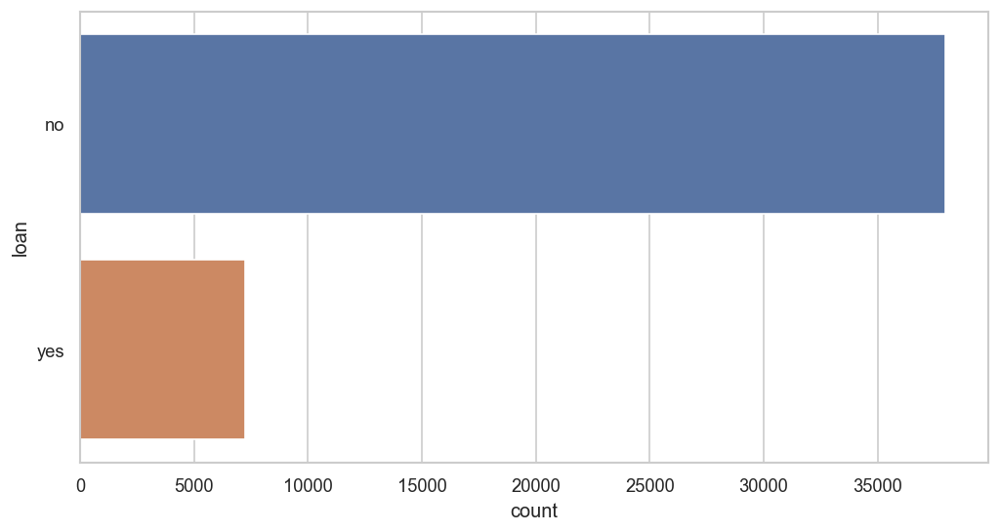


╔═══════════════════════════════════════════════════════════╗
║                          CONTACT                          ║
╚═══════════════════════════════════════════════════════════╝

╔═════════════════════════════════════════════╗
║ There are 3 unique values in CONTACT column ║
╚═════════════════════════════════════════════╝


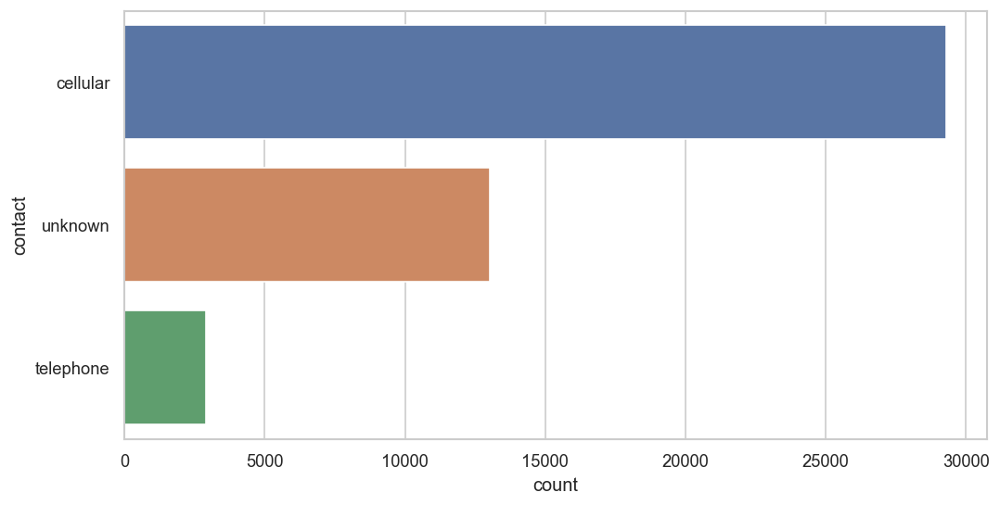


╔═════════════════════════════════════════════════════════╗
║                          MONTH                          ║
╚═════════════════════════════════════════════════════════╝

╔════════════════════════════════════════════╗
║ There are 12 unique values in MONTH column ║
╚════════════════════════════════════════════╝


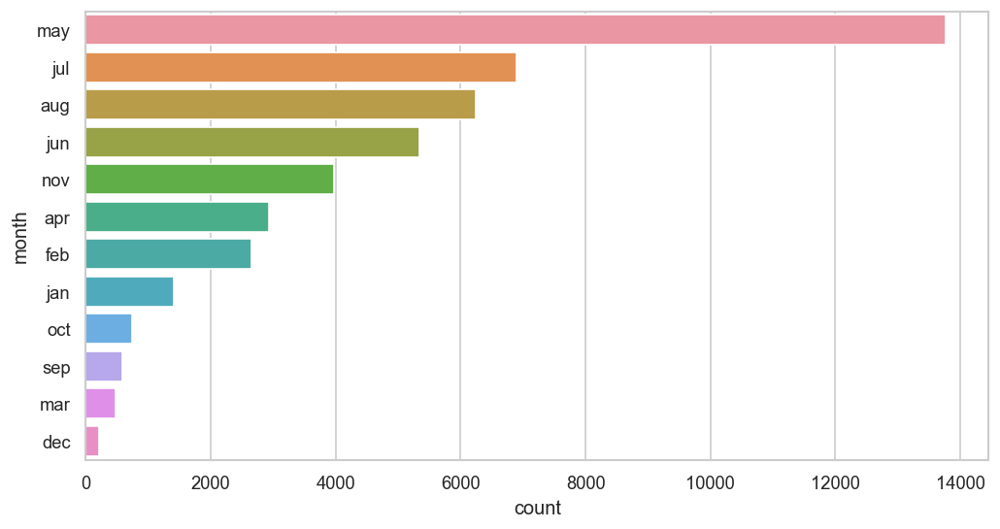


╔════════════════════════════════════════════════════════════╗
║                          POUTCOME                          ║
╚════════════════════════════════════════════════════════════╝

╔══════════════════════════════════════════════╗
║ There are 4 unique values in POUTCOME column ║
╚══════════════════════════════════════════════╝


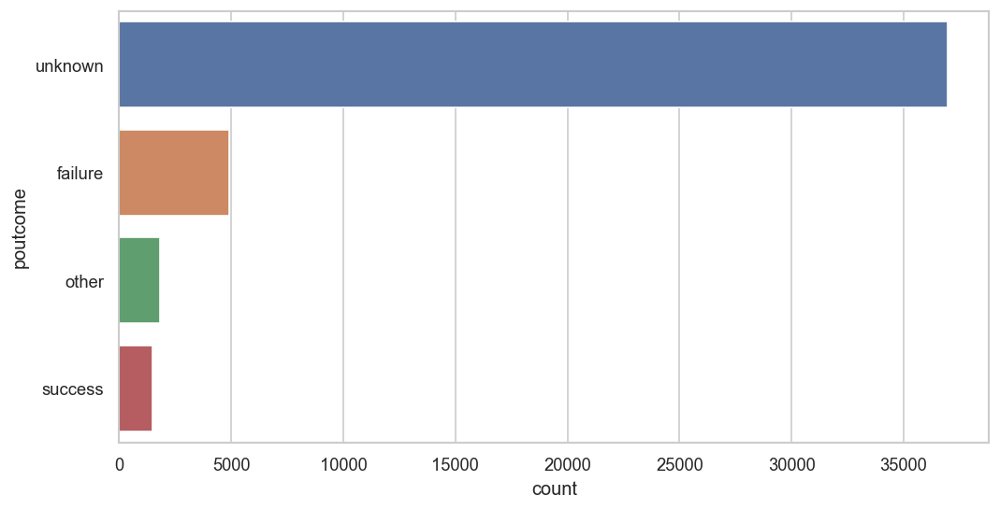


╔═════════════════════════════════════════════════════╗
║                          Y                          ║
╚═════════════════════════════════════════════════════╝

╔═══════════════════════════════════════╗
║ There are 2 unique values in Y column ║
╚═══════════════════════════════════════╝


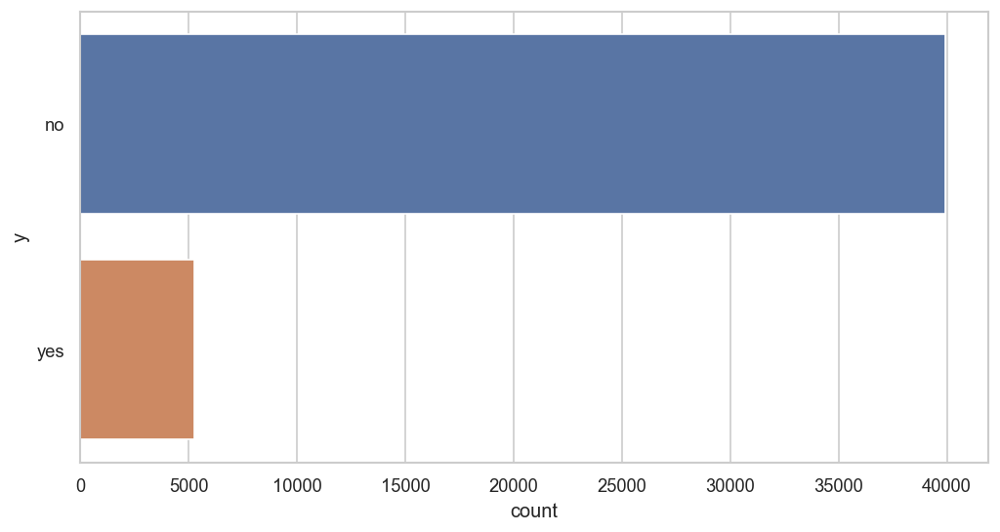

INT TYPE

╔═══════════════════════════════════════════════════════╗
║                          AGE                          ║
╚═══════════════════════════════════════════════════════╝

╔══════════════════════════════════════╗
║ Average value is : 40.93621021432837 ║
╚══════════════════════════════════════╝

╔═══════════════════════╗
║ Minumum value is : 18 ║
╚═══════════════════════╝

╔═══════════════════════╗
║ Maximum value is : 95 ║
╚═══════════════════════╝

╔════════════════════════════════════════════╗
║ Normal distributed Data Located below mean ║
╚════════════════════════════════════════════╝
None


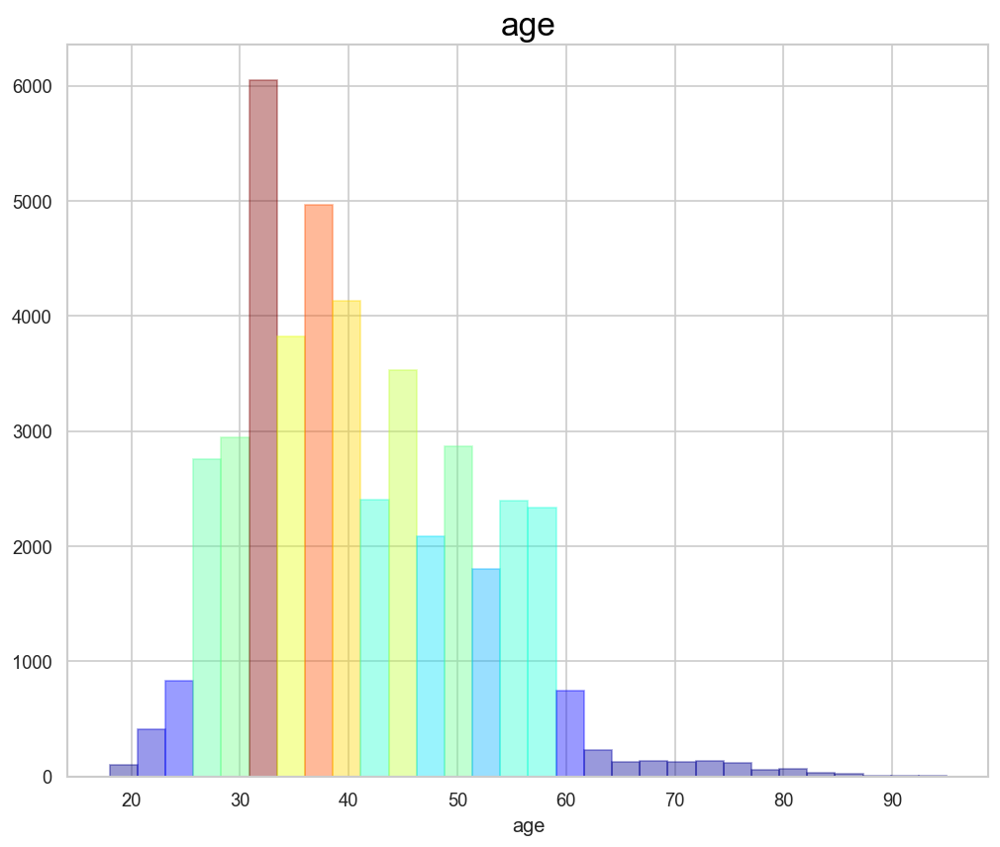


╔═══════════════════════════════════════════════════════════╗
║                          BALANCE                          ║
╚═══════════════════════════════════════════════════════════╝

╔═══════════════════════════════════════╗
║ Average value is : 1362.2720576850766 ║
╚═══════════════════════════════════════╝

╔══════════════════════════╗
║ Minumum value is : -8019 ║
╚══════════════════════════╝

╔═══════════════════════════╗
║ Maximum value is : 102127 ║
╚═══════════════════════════╝

╔════════════════════════════════════════════╗
║ Normal distributed Data Located above mean ║
╚════════════════════════════════════════════╝
None


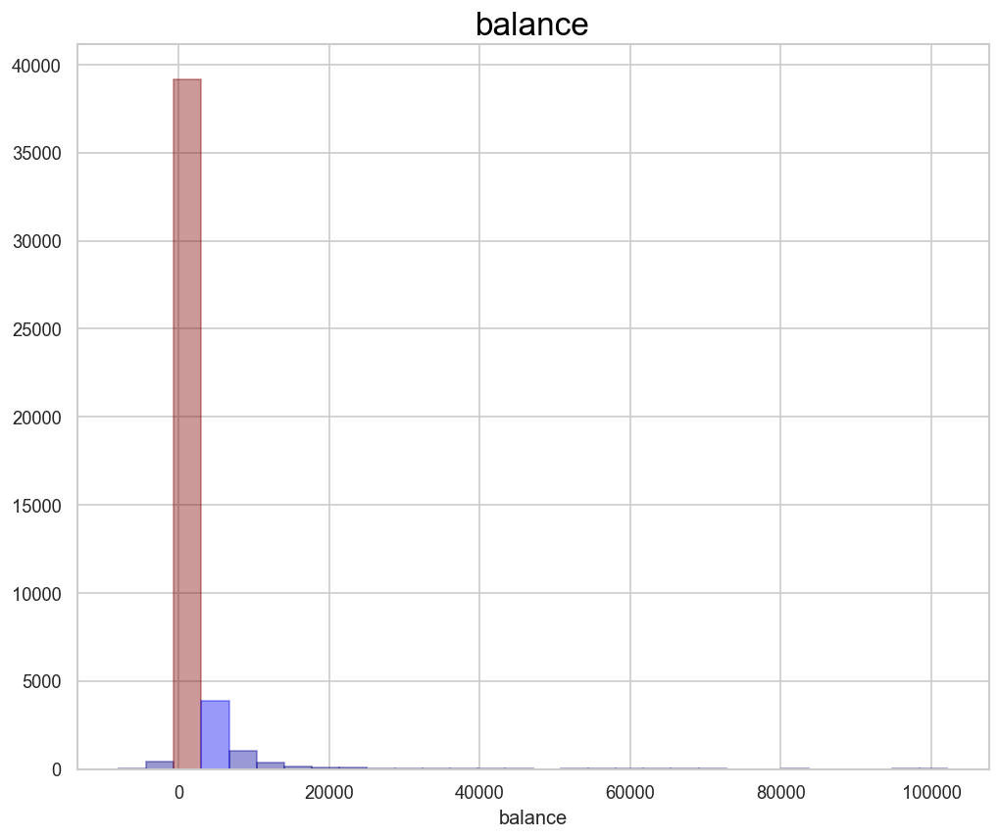


╔═══════════════════════════════════════════════════════╗
║                          DAY                          ║
╚═══════════════════════════════════════════════════════╝

╔══════════════════════════════════════╗
║ Average value is : 15.80641879188693 ║
╚══════════════════════════════════════╝

╔══════════════════════╗
║ Minumum value is : 1 ║
╚══════════════════════╝

╔═══════════════════════╗
║ Maximum value is : 31 ║
╚═══════════════════════╝

╔════════════════════════════════════════════╗
║ Normal distributed Data Located below mean ║
╚════════════════════════════════════════════╝
None


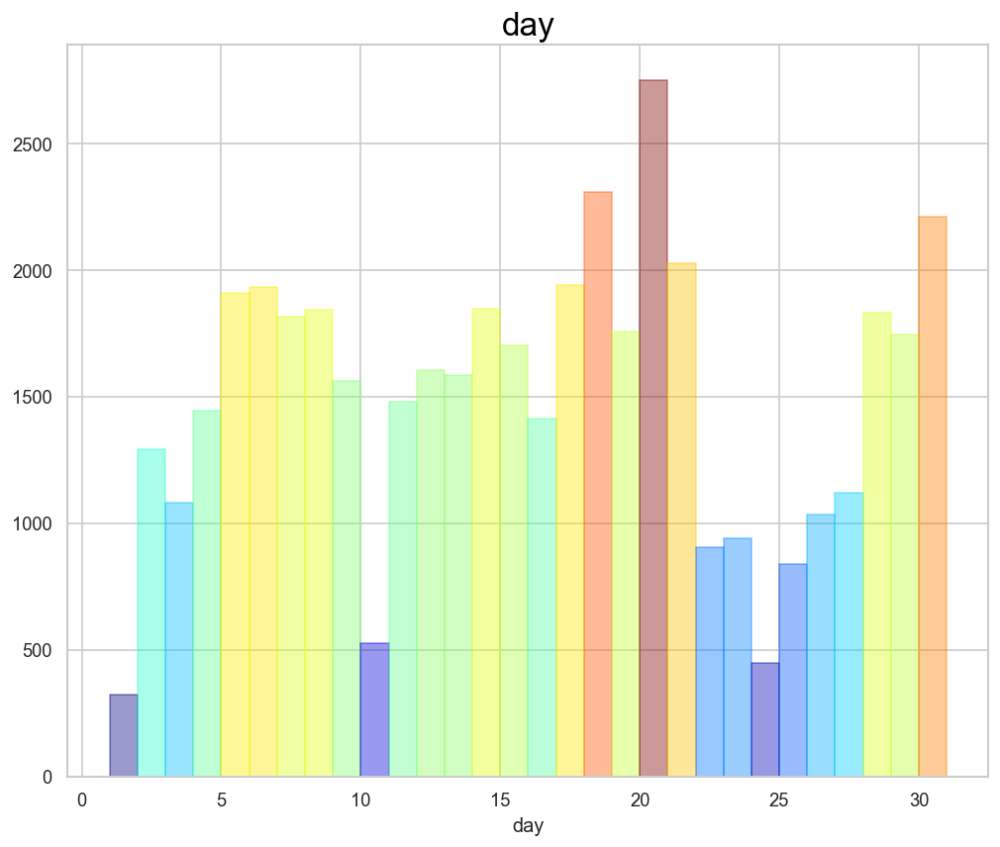


╔════════════════════════════════════════════════════════════╗
║                          DURATION                          ║
╚════════════════════════════════════════════════════════════╝

╔══════════════════════════════════════╗
║ Average value is : 258.1630797814691 ║
╚══════════════════════════════════════╝

╔══════════════════════╗
║ Minumum value is : 0 ║
╚══════════════════════╝

╔═════════════════════════╗
║ Maximum value is : 4918 ║
╚═════════════════════════╝

╔════════════════════════════════════════════╗
║ Normal distributed Data Located below mean ║
╚════════════════════════════════════════════╝
None


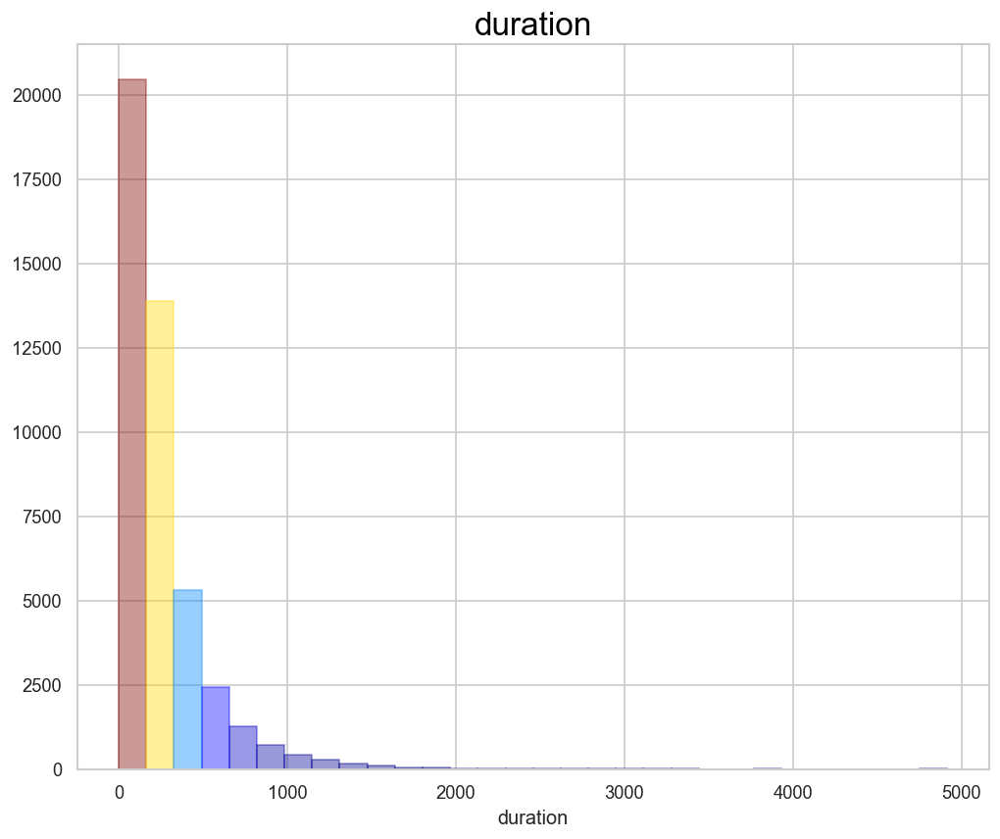


╔════════════════════════════════════════════════════════════╗
║                          CAMPAIGN                          ║
╚════════════════════════════════════════════════════════════╝

╔══════════════════════════════════════╗
║ Average value is : 2.763840658246887 ║
╚══════════════════════════════════════╝

╔══════════════════════╗
║ Minumum value is : 1 ║
╚══════════════════════╝

╔═══════════════════════╗
║ Maximum value is : 63 ║
╚═══════════════════════╝

╔════════════════════════════════════════════╗
║ Normal distributed Data Located above mean ║
╚════════════════════════════════════════════╝
None


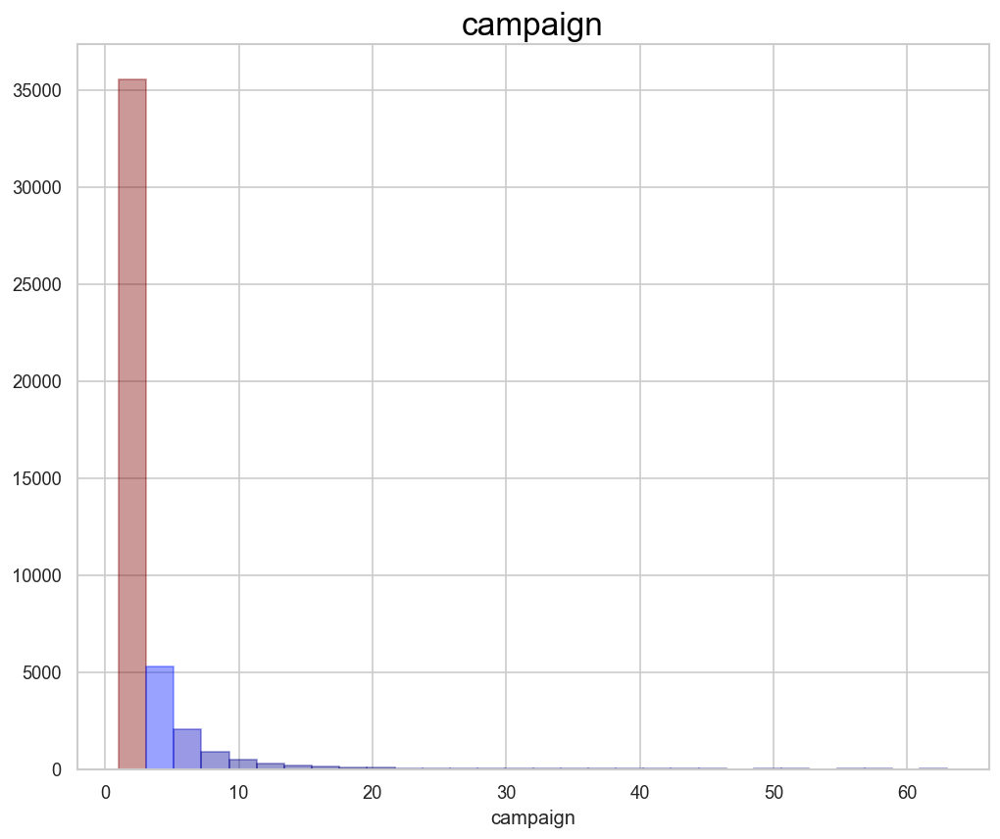


╔═════════════════════════════════════════════════════════╗
║                          PDAYS                          ║
╚═════════════════════════════════════════════════════════╝

╔══════════════════════════════════════╗
║ Average value is : 40.19782796222158 ║
╚══════════════════════════════════════╝

╔═══════════════════════╗
║ Minumum value is : -1 ║
╚═══════════════════════╝

╔════════════════════════╗
║ Maximum value is : 871 ║
╚════════════════════════╝

╔════════════════════════════════════════════╗
║ Normal distributed Data Located above mean ║
╚════════════════════════════════════════════╝
None


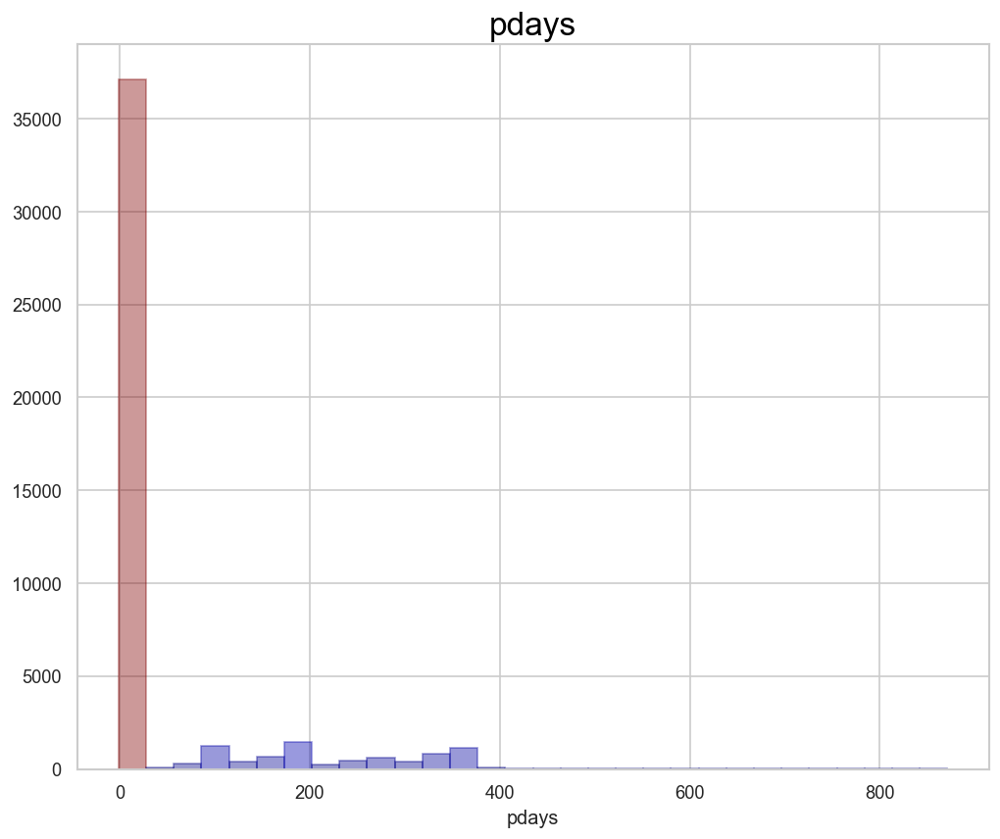


╔════════════════════════════════════════════════════════════╗
║                          PREVIOUS                          ║
╚════════════════════════════════════════════════════════════╝

╔═══════════════════════════════════════╗
║ Average value is : 0.5803233726305546 ║
╚═══════════════════════════════════════╝

╔══════════════════════╗
║ Minumum value is : 0 ║
╚══════════════════════╝

╔════════════════════════╗
║ Maximum value is : 275 ║
╚════════════════════════╝

╔════════════════════════════════════════════╗
║ Normal distributed Data Located above mean ║
╚════════════════════════════════════════════╝
None


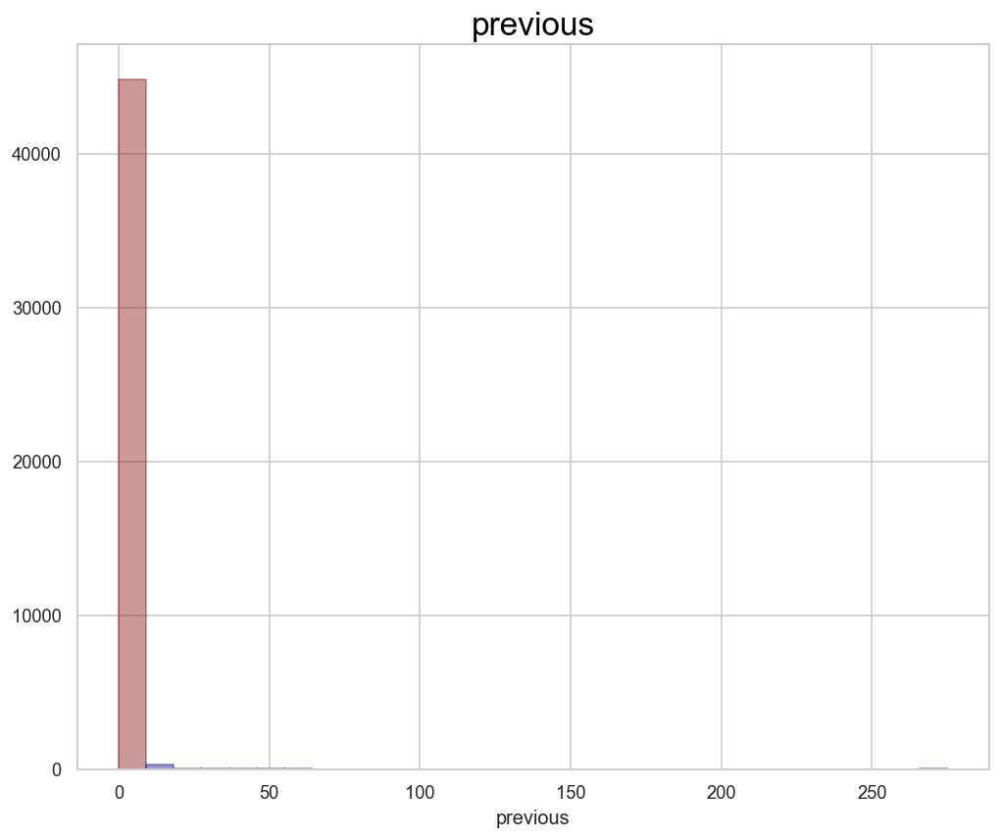

In [328]:
class EDA:
    
    def row(self,data):
        fig = make_subplots(rows=1, cols=2)
        fig.add_trace(go.Indicator(mode = "number", value = data.shape[0], number={'font':{'color': '#E58F65','size':100}}, title = {"text": "🧾 Rows<br><span style='font-size:0.8em;color:gray'>In the Dataframe</span>"}, domain = {'x': [0, 0.5], 'y': [0.6, 1]}))
        fig.add_trace(go.Indicator(mode = "number", value = data.shape[1], number={'font':{'color': '#E58F65','size':100}}, title = {"text": "⭕ Columns<br><span style='font-size:0.8em;color:gray'>In the Dataframe</span>"}, domain = {'x': [0.5, 1], 'y': [0, 0.4]}))
        fig.show()
    
    def border_msg(self,msg, indent=1, width=None, title=None):
        """Print message-box with optional title."""
        lines = msg.split('\n')
        space = " " * indent
        if not width:
            width = max(map(len, lines))
        box = f'╔{"═" * (width + indent * 2)}╗\n'  
        if title:
            box += f'║{space}{title:<{width}}{space}║\n'  
            box += f'║{space}{"-" * len(title):<{width}}{space}║\n'  
        box += ''.join([f'║{space}{line:<{width}}{space}║\n' for line in lines])
        box += f'╚{"═" * (width + indent * 2)}╝' 
        print('\033[92m'+'\033[1m')
        print(box)
        
    def distribution(self,x,title):
        plt.figure(figsize=(10,8))
        ax = sns.distplot(x, kde=False,bins=30)
        values = np.array([rec.get_height() for rec in ax.patches])
        norm = plt.Normalize(values.min(), values.max())
        colors = plt.cm.jet(norm(values))
        for rec, col in zip(ax.patches,colors):
            rec.set_color(col)
        plt.title(title, size=20, color='black')
        
    def run(self,b):
        
        self.row(b)
        if len(b)>0:
            
            object_b = b.select_dtypes('object').columns.tolist()
            int_b = b.select_dtypes('int').columns.tolist()
            bool_b = b.select_dtypes('bool').columns.tolist()
            float_b = b.select_dtypes('float').columns.tolist()

            if len(object_b)>0:
                
                print( '\033[1m'+"OBJECT TYPE")
                for col in object_b:
                    self.border_msg(' '*25+ col.upper() + ' '*25)
                    self.border_msg('There are {} unique values in {} column'.format(b[col].nunique(),col.upper()))
                    plt.figure(figsize=(10,5))
                    sns.countplot(y = col, data = b,
                                  order = b[col].value_counts().index)
                    plt.show()
                    
            if len(int_b)>0:
                
                print('\033[1m'+"INT TYPE")
                for col in int_b:
                    self.border_msg(' '*25+ col.upper() + ' '*25)
                    self.border_msg('Average value is : {}'.format(b[col].mean()))
                    self.border_msg('Minumum value is : {}'.format(b[col].min()))
                    self.border_msg('Maximum value is : {}'.format(b[col].max()))
                    self.distribution(b[col],title=col)
                    if b[col].mean()>b[col].std():
                        print(self.border_msg("Normal distributed Data Located below mean"))
                        
                    elif b[col].mean()<b[col].std():
                        print(self.border_msg("Normal distributed Data Located above mean"))
                    else:
                        self.border_msg("Mean Equals Std Dev - Distribution is normal")
                        
                    fig = make_subplots(rows=1, cols=2)
                    fig.add_trace(go.Indicator(mode = "number", value = b[col].mean(), number={'font':{'color': '#E58F65','size':100}}, title = {"text": "📌 Mean<br><span style='font-size:0.8em;color:gray'></span>"}, domain = {'x': [0, 0.5], 'y': [0.6, 1]}))
                    fig.add_trace(go.Indicator(mode = "number", value = b[col].std(), number={'font':{'color': '#E58F65','size':100}}, title = {"text": "🖇 Standart dev<br><span style='font-size:0.8em;color:gray'></span>"}, domain = {'x': [0.5, 1], 'y': [0, 0.4]}))
                    fig.show()
                    plt.show()
                 

            if len(bool_b)>0:
                
                print('\033[1m'+"BOOL TYPE")
                for col in bool_b:
                    self.border_msg(' '*25+ col.upper() + ' '*25)
                    plt.figure(figsize=(10,5))
                    sns.countplot(y = col, data = b,
                                  order = b[col].value_counts().index)
                    plt.show()
                    
            if len(float_b)>0:
                
                print('\033[1m'+"FLOAT TYPE")
                for col in float_b:
                    for col in int_b:
                        self.distribution(b[col],title=col)
                        if b[col].mean()>b[col].std():
                            print(self.border_msg("Normal distributed Data Located below mean"))
                        
                        elif b[col].mean()<b[col].std():
                            print(self.border_msg("Normal distributed Data Located above mean"))
                        else:
                            self.border_msg("Mean Equals Std Dev - Distribution is normal")
frame = EDA().run(b)

<Axes: title={'center': 'Bank Marketing'}>

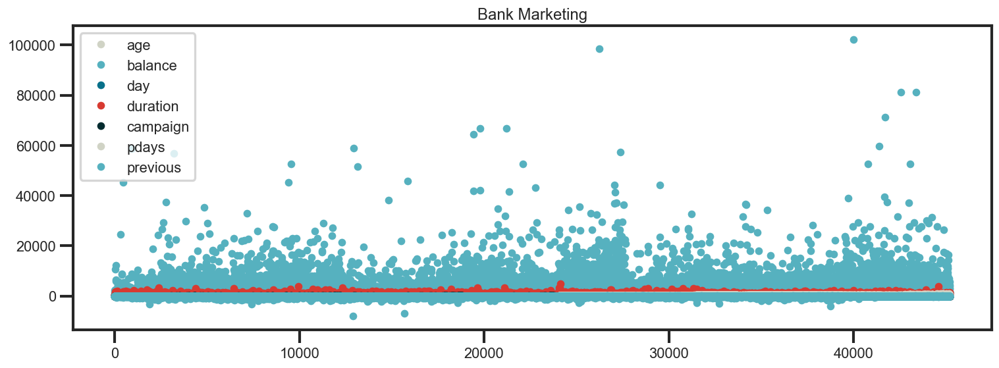

In [23]:
b.plot(figsize=(15,5),style='.',title='Bank Marketing')

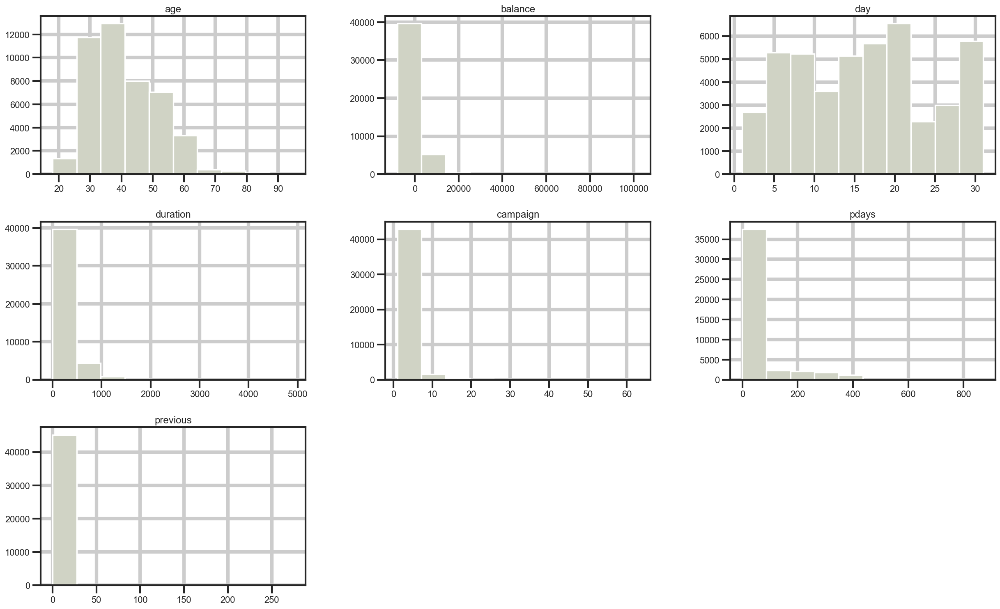

In [25]:
b.hist(figsize=(25,15))
plt.show()

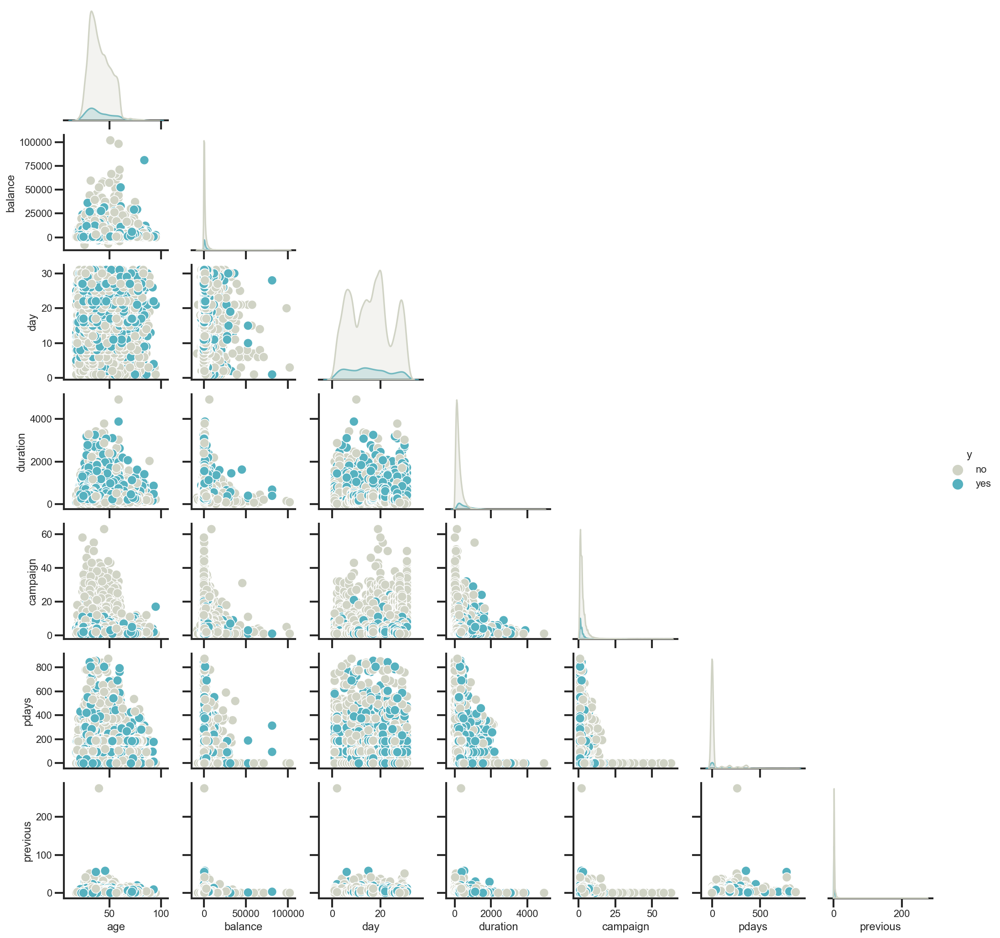

In [32]:
sns.pairplot(b,hue='y',corner=True)

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0, 0.5, 'age'),
  Text(0, 1.5, 'balance'),
  Text(0, 2.5, 'day'),
  Text(0, 3.5, 'duration'),
  Text(0, 4.5, 'campaign'),
  Text(0, 5.5, 'pdays'),
  Text(0, 6.5, 'previous')])

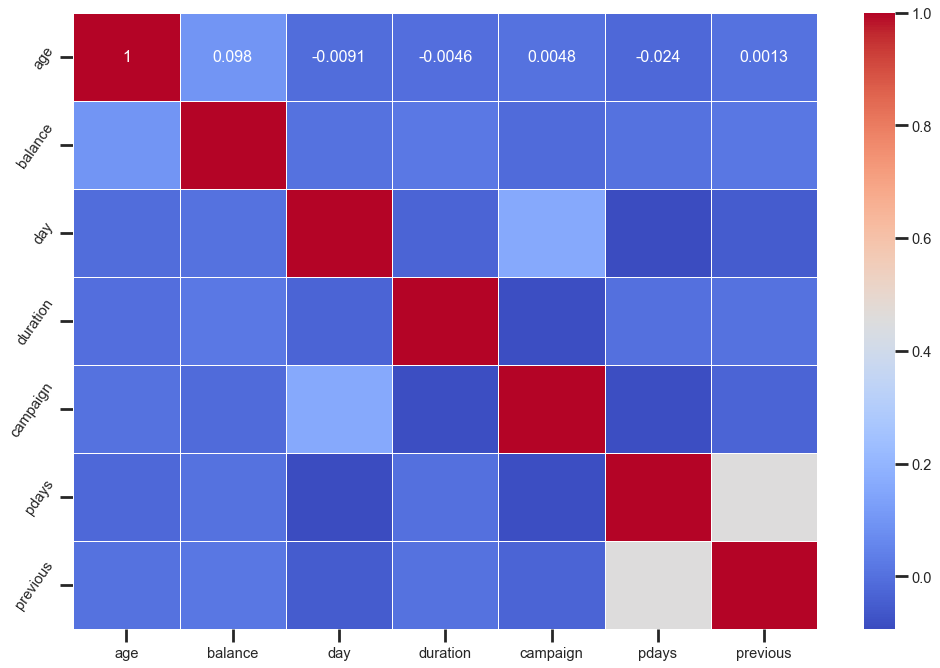

In [34]:
plt.figure(figsize=(15,10),dpi=80)
sns.heatmap(b.corr(),cmap="coolwarm",annot=True,linewidth=0.5)
plt.yticks(rotation=55)

In [329]:
sample  = b.rename(columns={"balance":"Active Balance","job":"Occupation"})
fig = px.treemap(sample, path=[px.Constant('Active Balance'),'Occupation'], values='Active Balance',
                   hover_data=['Occupation'])
fig.show()

In [330]:
management = b[b.job=='management']
fig = px.box(management, x="marital", y="balance", 
             color="y", points="all",
            )
fig.update_traces(quartilemethod="exclusive")
fig.update_layout(
    title={
         'text': "Management behevior on Martial",
            'y':0.95,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
    xaxis_title="Martial Status",
    yaxis_title="Active Balance",
    legend_title="y Status",
    font=dict(
        family="Arial",
        size=18,
        color="DarkBlue"
    )
)
fig.update_layout(xaxis=dict(showgrid=False),
              yaxis=dict(showgrid=False)
)
fig.show()

In [331]:
vals = b['marital'].value_counts().tolist()
labels = ['married', 'divorced', 'single']

data = [go.Bar(
            x=labels,
            y=vals,
    marker=dict(
    color="#FE9A2E")
    )]

layout = go.Layout(
    title="Count by Marital Status",
)

fig = go.Figure(data=data, layout=layout)



iplot(fig, filename='basic-bar')

In [332]:
fig = ff.create_facet_grid(
    b,x='duration',y='balance',color_name='marital',show_boxes=False,marker={'size': 10, 'opacity': 1.0},
    colormap={'single': 'rgb(165, 242, 242)', 'married': 'rgb(253, 174, 216)', 'divorced': 'rgba(201, 109, 59, 0.82)'})

iplot(fig, filename='facet - custom colormap')

In [333]:
fig = ff.create_facet_grid(
    b,
    y='balance',
    facet_row='marital',
    facet_col='y',
    trace_type='box',
)

iplot(fig, filename='facet - box traces')

In [334]:
loan_balance = b.groupby(['education', 'loan'], as_index=False)['balance'].median()


no_loan = loan_balance['balance'].loc[loan_balance['loan'] == 'no'].values
has_loan = loan_balance['balance'].loc[loan_balance['loan'] == 'yes'].values


labels = loan_balance['education'].unique().tolist()


trace0 = go.Scatter(
    x=no_loan,
    y=labels,
    mode='markers',
    name='No Loan',
    marker=dict(
        color='rgb(175,238,238)',
        line=dict(
            color='rgb(0,139,139)',
            width=1,
        ),
        symbol='circle',
        size=16,
    )
)
trace1 = go.Scatter(
    x=has_loan,
    y=labels,
    mode='markers',
    name='Has a Previous Loan',
    marker=dict(
        color='rgb(250,128,114)',
        line=dict(
            color='rgb(178,34,34)',
            width=1,
        ),
        symbol='circle',
        size=16,
    )
)

data = [trace0, trace1]
layout = go.Layout(
    title="The Impact of Loans to Married/Educational Clusters",
    xaxis=dict(
        showgrid=False,
        showline=True,
        linecolor='rgb(102, 102, 102)',
        titlefont=dict(
            color='rgb(204, 204, 204)'
        ),
        tickfont=dict(
            color='rgb(102, 102, 102)',
        ),
        showticklabels=False,
        dtick=10,
        ticks='outside',
        tickcolor='rgb(102, 102, 102)',
    ),
    margin=dict(
        l=140,
        r=40,
        b=50,
        t=80
    ),
    legend=dict(
        font=dict(
            size=10,
        ),
        yanchor='middle',
        xanchor='right',
    ),
    width=1000,
    height=800,
    paper_bgcolor='rgb(255,250,250)',
    plot_bgcolor='rgb(255,255,255)',
    hovermode='closest',
)
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='lowest-oecd-votes-cast')

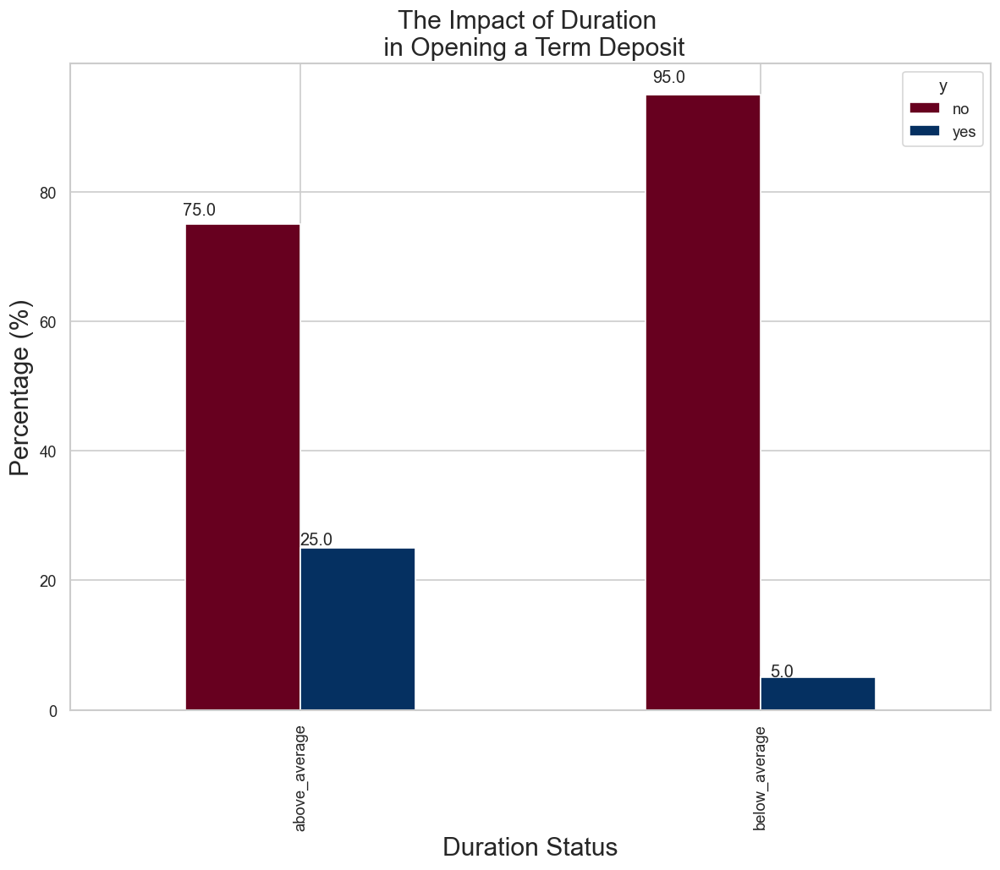

In [128]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_style('whitegrid')
avg_duration = b['duration'].mean()

lst = [b]
b["duration_status"] = np.nan

for col in lst:
    col.loc[col["duration"] < avg_duration, "duration_status"] = "below_average"
    col.loc[col["duration"] > avg_duration, "duration_status"] = "above_average"
    
pct_term = pd.crosstab(b['duration_status'], b['y']).apply(lambda r: round(r/r.sum(), 2) * 100, axis=1)


ax = pct_term.plot(kind='bar', stacked=False, cmap='RdBu')
plt.title("The Impact of Duration \n in Opening a Term Deposit", fontsize=18)
plt.xlabel("Duration Status", fontsize=18);
plt.ylabel("Percentage (%)", fontsize=18)

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.02, p.get_height() * 1.02))
    

plt.show()

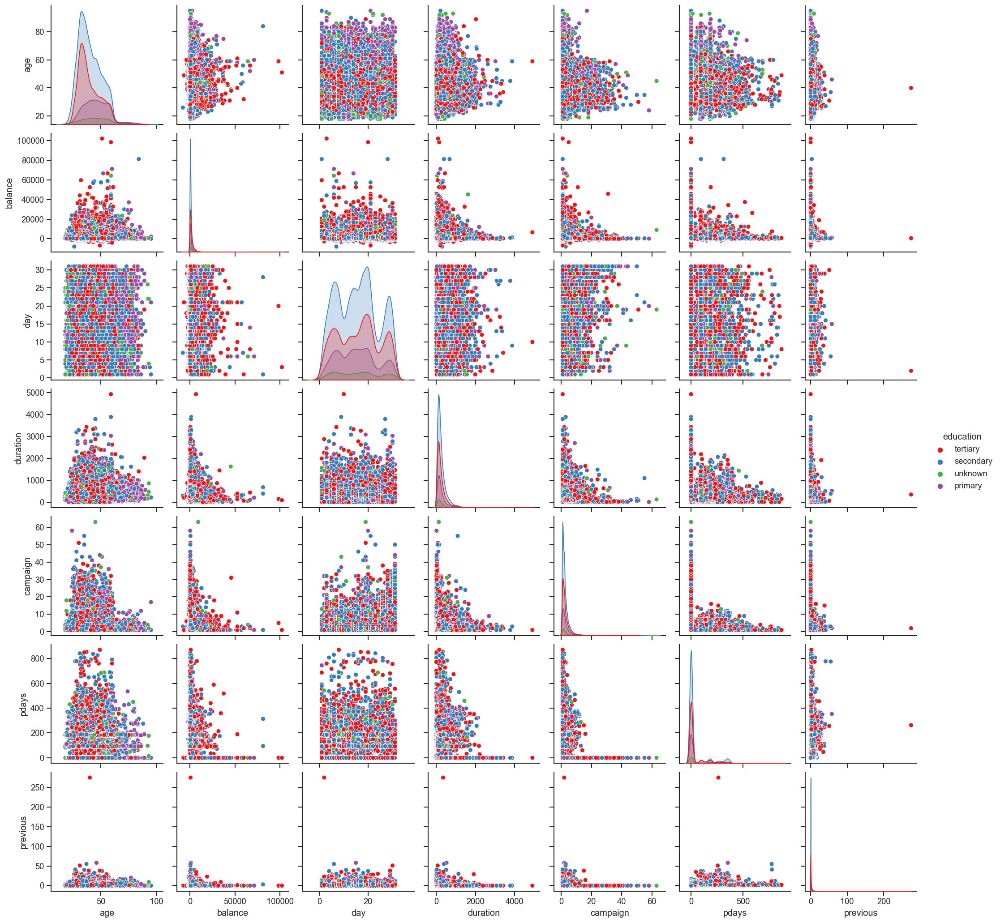

In [126]:
sns.set(style="ticks")

sns.pairplot(b, hue="education", palette="Set1")
plt.show()

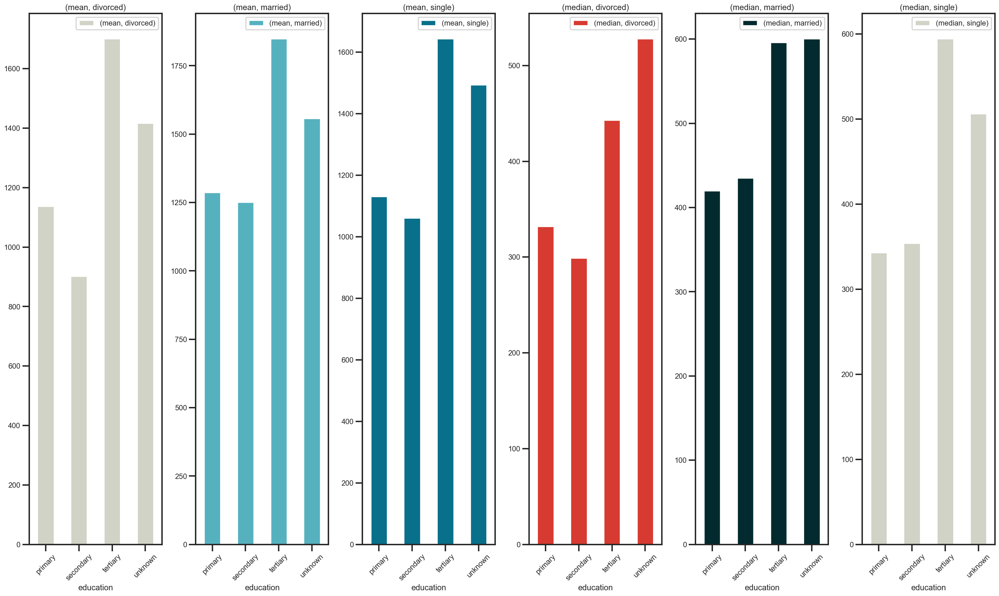

In [45]:
education= b.groupby(['marital','education'], as_index=False)['balance'].agg({np.median,np.mean})
education = round(education,2)

ax = education.unstack(level=0).plot(kind='bar', subplots=True, rot=45, figsize=(25, 15), layout=(1, 6))
plt.tight_layout()

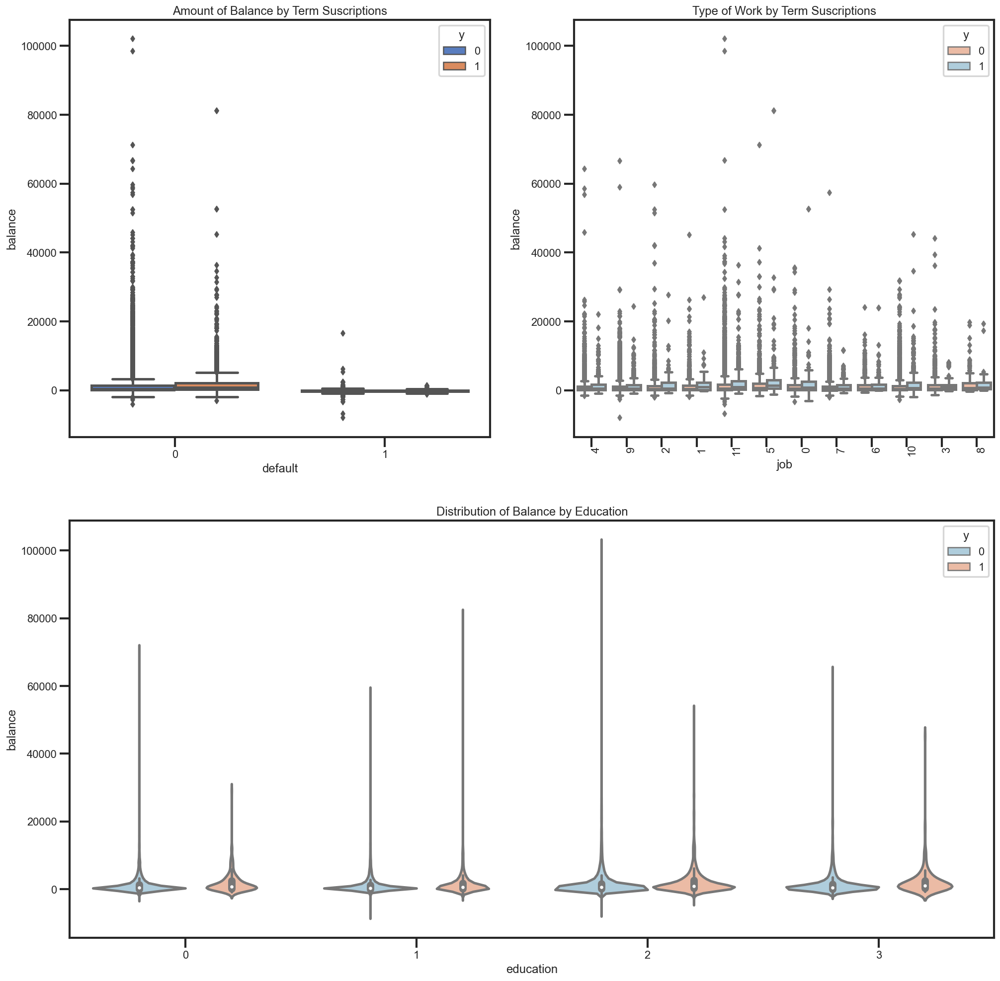

In [72]:
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(212)

g = sns.boxplot(x="default", y="balance", hue="y",
                    data=b, palette="muted", ax=ax1)

g.set_title("Amount of Balance by Term Suscriptions")

# ax.set_xticklabels(b["default"].unique(), rotation=45, rotation_mode="anchor")

g1 = sns.boxplot(x="job", y="balance", hue="y",
                 data=b, palette="RdBu", ax=ax2)

g1.set_xticklabels(b["job"].unique(), rotation=90, rotation_mode="anchor")
g1.set_title("Type of Work by Term Suscriptions")

g2 = sns.violinplot(data=b, x="education", y="balance", hue="y", palette="RdBu_r")

g2.set_title("Distribution of Balance by Education")


plt.show()

no     37967
yes     7244
Name: loan, dtype: int64


<Axes: xlabel='loan', ylabel='count'>

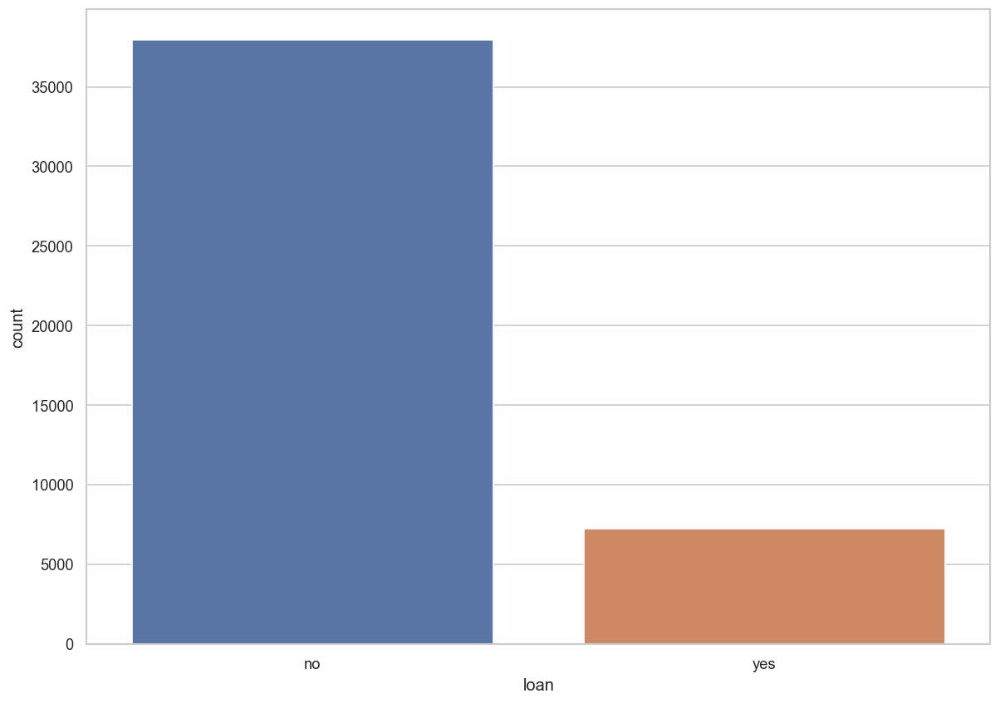

In [131]:
print(b.loan.value_counts())
sns.countplot(data=b,x='loan')

In [163]:
le = LabelEncoder()
b.marital = le.fit_transform(b.marital)
b.housing = le.fit_transform(b.housing)
b.job = le.fit_transform(b.job)
b.loan = le.fit_transform(b.loan)
b.default = le.fit_transform(b.default)
b.y = le.fit_transform(b.y)
b.education = le.fit_transform(b.education)
b.contact = le.fit_transform(b.contact)
b.month = le.fit_transform(b.month)
b.poutcome = le.fit_transform(b.poutcome)
b.dtypes

age          int64
job          int32
marital      int32
education    int32
default      int32
balance      int64
housing      int32
loan         int32
contact      int32
day          int64
month        int32
duration     int64
campaign     int64
pdays        int64
previous     int64
poutcome     int32
y            int32
dtype: object

In [164]:
data = b['loan']
length = int(len(b['loan']) * 0.90)
print('Length:', length)
print('Data length:',len(data))
train = data.iloc[:length]
print('training shape',train.shape)
test = data.iloc[length:]
print('testing shape',test.shape)

Length: 40689
Data length: 45211
training shape (40689,)
testing shape (4522,)


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=43782.166, Time=3.22 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=41695.337, Time=1.43 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=42213.884, Time=2.52 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=40514.853, Time=2.05 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=39624.131, Time=2.36 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=inf, Time=27.82 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=23.22 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=35806.236, Time=4.90 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=35884.947, Time=3.69 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=34792.706, Time=67.74 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=34989.786, Time=57.94 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=72.61 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=65.05 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 335.071 seconds
                         

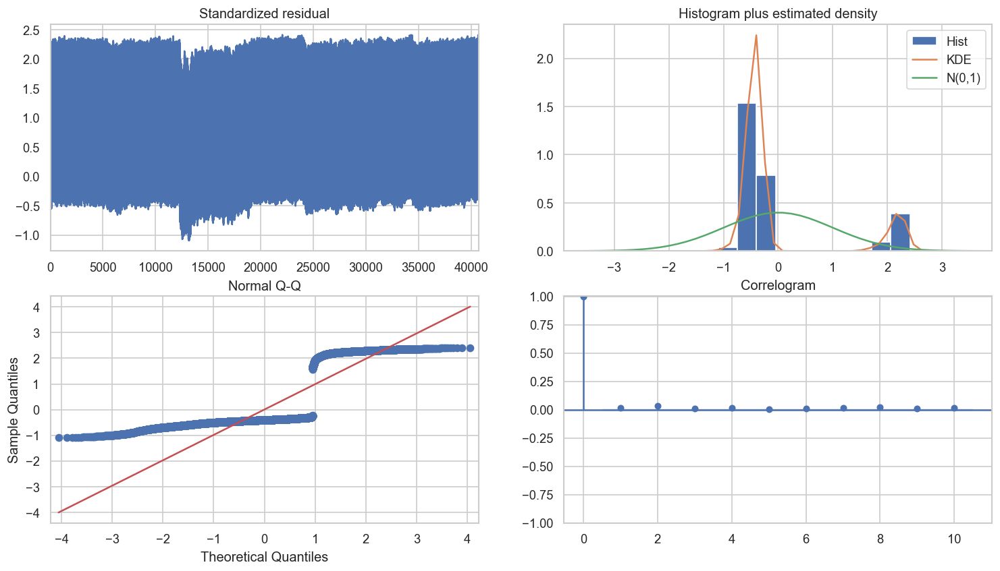

In [140]:
from pmdarima.arima import auto_arima

model_autoARIMA = auto_arima(train, start_p=0, start_q=0,
                      test='adf',
                      max_p=3, max_q=3,
                      m=1,
                      d=None,
                      seasonal=False,
                      start_P=0,
                      D=0,
                      trace=True,
                      error_action='ignore',
                      suppress_warnings=True,
                      stepwise=True)
print(model_autoARIMA.summary())
model_autoARIMA.plot_diagnostics(figsize=(15,8))
plt.show()

In [268]:
x = b.drop('loan',axis=1)
y = b['loan']

In [166]:
KF = KFold(n_splits=3,shuffle=True)
for train_index, test_index in KF.split(x):
    x_train, x_test = x.iloc[list(train_index)], x.iloc[list(test_index)]
    y_train, y_test = y.iloc[list(train_index)], y.iloc[list(test_index)]
    
print("Train data shape:{}".format(x_train.shape))
print("Test data shape:{}".format(x_test.shape))

Train data shape:(30141, 16)
Test data shape:(15070, 16)


In [167]:
scaler = MinMaxScaler()
scaled_train = scaler.fit_transform(x_train)
scaled_test = scaler.transform(x_test)

In [168]:
dict_classifiers = {
    "Logistic Regression": LogisticRegression(),
    "Nearest Neighbors": KNeighborsClassifier(),
    "Linear SVM": SVC(),
    "Gradient Boosting Classifier": GradientBoostingClassifier(),
    "Decision Tree": tree.DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(n_estimators=18),
    "Neural Net": MLPClassifier(alpha=1),
    "Naive Bayes": GaussianNB()
}
#  Thanks to Ahspinar for the function. 
no_classifiers = len(dict_classifiers.keys())

def batch_classify(x_train, y_train, verbose = True):
    b_results = pd.DataFrame(data=np.zeros(shape=(no_classifiers,3)), columns = ['classifier', 'train_score', 'training_time'])
    count = 0
    for key, classifier in dict_classifiers.items():
        t_start = time.process_time()
        classifier.fit(x_train, y_train)
        t_end = time.process_time()
        t_diff = t_end - t_start
        train_score = classifier.score(x_train, y_train)
        b_results.loc[count,'classifier'] = key
        b_results.loc[count,'train_score'] = train_score
        b_results.loc[count,'training_time'] = t_diff
        if verbose:
            print("trained {c} in {f:.2f} s".format(c=key, f=t_diff))
        count+=1
    return b_results
b_results = batch_classify(x_train, y_train)
print(b_results.sort_values(by='train_score', ascending=False))

trained Logistic Regression in 0.94 s
trained Nearest Neighbors in 0.02 s
trained Linear SVM in 33.92 s
trained Gradient Boosting Classifier in 6.34 s
trained Decision Tree in 0.36 s
trained Random Forest in 1.50 s
trained Neural Net in 5.00 s
trained Naive Bayes in 0.03 s
                     classifier  train_score  training_time
4                 Decision Tree     1.000000       0.359375
5                 Random Forest     0.991407       1.500000
1             Nearest Neighbors     0.850536       0.015625
3  Gradient Boosting Classifier     0.843701       6.343750
0           Logistic Regression     0.839255       0.937500
2                    Linear SVM     0.839255      33.921875
6                    Neural Net     0.835374       5.000000
7                   Naive Bayes     0.829667       0.031250


In [169]:
# Logistic Regression
log_reg = LogisticRegression()
log_scores = cross_val_score(log_reg, x_train, y_train, cv=3)
log_reg_mean = log_scores.mean()

# SVC
svc_clf = SVC()
svc_scores = cross_val_score(svc_clf, x_train, y_train, cv=3)
svc_mean = svc_scores.mean()

# KNearestNeighbors
knn_clf = KNeighborsClassifier()
knn_scores = cross_val_score(knn_clf, x_train, y_train, cv=3)
knn_mean = knn_scores.mean()

# Decision Tree
tree_clf = tree.DecisionTreeClassifier()
tree_scores = cross_val_score(tree_clf, x_train, y_train, cv=3)
tree_mean = tree_scores.mean()

# Gradient Boosting Classifier
grad_clf = GradientBoostingClassifier()
grad_scores = cross_val_score(grad_clf, x_train, y_train, cv=3)
grad_mean = grad_scores.mean()

# Random Forest Classifier
rand_clf = RandomForestClassifier(n_estimators=18)
rand_scores = cross_val_score(rand_clf, x_train, y_train, cv=3)
rand_mean = rand_scores.mean()

# NeuralNet Classifier
neural_clf = MLPClassifier(alpha=1)
neural_scores = cross_val_score(neural_clf, x_train, y_train, cv=3)
neural_mean = neural_scores.mean()

# Naives Bayes
nav_clf = GaussianNB()
nav_scores = cross_val_score(nav_clf, x_train, y_train, cv=3)
nav_mean = neural_scores.mean()

# Create a Dataframe with the results.
d = {'Classifiers': ['Logistic Reg.', 'SVC', 'KNN', 'Dec Tree', 'Grad B CLF', 'Rand FC', 'Neural Classifier', 'Naives Bayes'], 
    'Crossval Mean Scores': [log_reg_mean, svc_mean, knn_mean, tree_mean, grad_mean, rand_mean, neural_mean, nav_mean]}

result_df = pd.DataFrame(data=d)

In [171]:
result_df = result_df.sort_values(by=['Crossval Mean Scores'], ascending=False)
result_df

,Classifiers,Crossval Mean Scores
1,SVC,0.839222
0,Logistic Reg.,0.839156
6,Neural Classifier,0.836999
7,Naives Bayes,0.836999
2,KNN,0.812647
4,Grad B CLF,0.735543
5,Rand FC,0.727514
3,Dec Tree,0.604061


In [176]:
y_train_pred = cross_val_predict(grad_clf, x_train, y_train, cv=3)

grad_clf.fit(x_train, y_train)
print ("Gradient Boost Classifier accuracy is %2.2f" % accuracy_score(y_train, y_train_pred))

Gradient Boost Classifier accuracy is 0.74


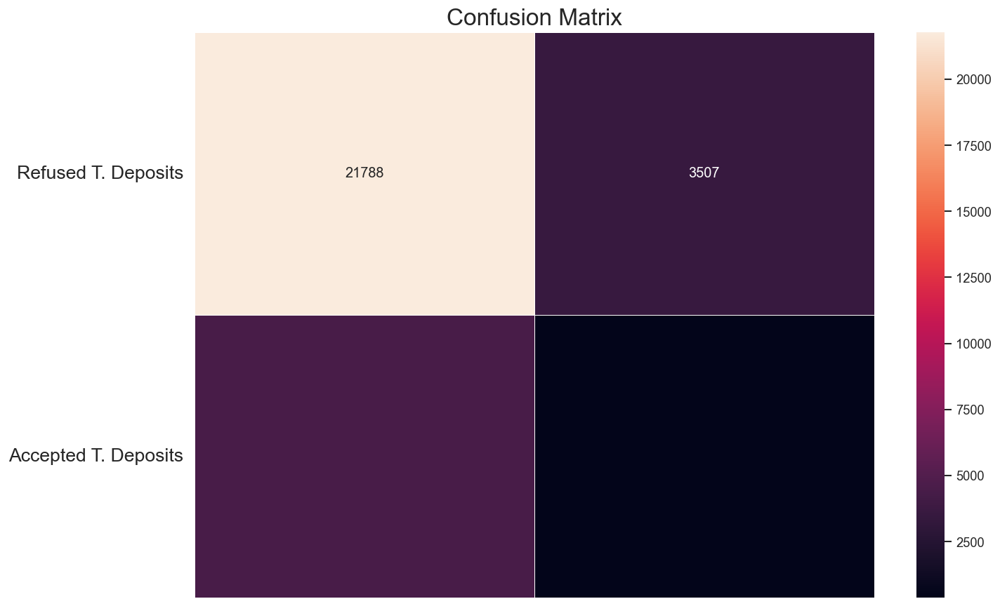

In [177]:
conf_matrix = confusion_matrix(y_train, y_train_pred)
f, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", linewidths=.5, ax=ax)
plt.title("Confusion Matrix", fontsize=20)
plt.subplots_adjust(left=0.15, right=0.99, bottom=0.15, top=0.99)
ax.set_yticks(np.arange(conf_matrix.shape[0]) + 0.5, minor=False)
ax.set_xticklabels("")
ax.set_yticklabels(['Refused T. Deposits', 'Accepted T. Deposits'], fontsize=16, rotation=360)
plt.show()

In [179]:
print('Precision Score: ', precision_score(y_train, y_train_pred))

print('Recall Score: ', recall_score(y_train, y_train_pred))

print('f1_score: ', f1_score(y_train, y_train_pred))

Precision Score:  0.09822576497814348
Recall Score:  0.07882789929839043
f1_score:  0.08746422438465942


Feature ranking:
1. feature 5 (0.334451)
2. feature 9 (0.288298)
3. feature 6 (0.169846)
4. feature 8 (0.063479)
5. feature 2 (0.033135)
6. feature 3 (0.028837)
7. feature 1 (0.023919)
8. feature 14 (0.017666)
9. feature 10 (0.015865)
10. feature 0 (0.007771)
11. feature 11 (0.007701)
12. feature 7 (0.005620)
13. feature 12 (0.003414)
14. feature 15 (0.000000)
15. feature 13 (0.000000)
16. feature 4 (0.000000)


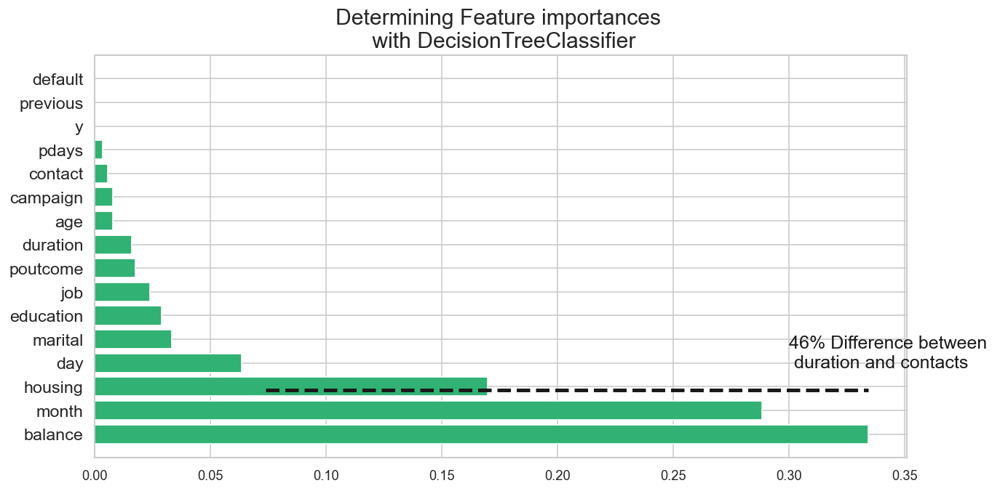

In [255]:
b['job'] = b['job'].astype('category').cat.codes
b['marital'] = b['marital'].astype('category').cat.codes
b['education'] = b['education'].astype('category').cat.codes
b['contact'] = b['contact'].astype('category').cat.codes
b['poutcome'] = b['poutcome'].astype('category').cat.codes
b['month'] = b['month'].astype('category').cat.codes
b['default'] = b['default'].astype('category').cat.codes
b['loan'] = b['loan'].astype('category').cat.codes
b['housing'] = b['housing'].astype('category').cat.codes

# Let's create new splittings like before but now we modified the data so we need to do it one more time.
# Create train and test splits
target_name = 'loan'
x = b.drop('loan', axis=1)


label=b[target_name]

x_train, x_test, y_train, y_test = train_test_split(x,label,test_size=0.2, random_state=42, stratify=label)

# Build a classification task using 3 informative features
tree = tree.DecisionTreeClassifier(
    class_weight='balanced',
    min_weight_fraction_leaf = 0.01
    
)



tree = tree.fit(x_train, y_train)
importances = tree.feature_importances_
feature_names = b.drop('loan', axis=1).columns
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(x_train.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the feature importances of the forest
def feature_importance_graph(indices, importances, feature_names):
    plt.figure(figsize=(12,6))
    plt.title("Determining Feature importances \n with DecisionTreeClassifier", fontsize=18)
    plt.barh(range(len(indices)), importances[indices], color='#31B173',  align="center")
    plt.yticks(range(len(indices)), feature_names[indices], rotation='horizontal',fontsize=14)
    plt.ylim([-1, len(indices)])
    plt.axhline(y=1.85, xmin=0.21, xmax=0.952, color='k', linewidth=3, linestyle='--')
    plt.text(0.30, 2.8, '46% Difference between \n duration and contacts', color='k', fontsize=15)
    
feature_importance_graph(indices, importances, feature_names)
plt.show()

In [210]:
voting_clf = VotingClassifier(
    estimators=[('gbc', grad_clf), ('nav', nav_clf), ('neural', neural_clf)],
    voting='soft'
)

voting_clf.fit(x_train, y_train)

VotingClassifier(estimators=[('gbc', GradientBoostingClassifier()),
                             ('nav', GaussianNB()),
                             ('neural', MLPClassifier(alpha=1))],
                 voting='soft')

In [212]:
for clf in (grad_clf, nav_clf, neural_clf, voting_clf):
    clf.fit(x_train, y_train)
    predict = clf.predict(x_test)
    print(clf.__class__.__name__, accuracy_score(y_test, predict))

GradientBoostingClassifier 0.8417560544067234
GaussianNB 0.8276014596925799
MLPClassifier 0.8389914851266173
VotingClassifier 0.8383279884993918


In [229]:
scaler = MinMaxScaler()
scaled_train = scaler.fit_transform(x_train)
scaled_test = scaler.transform(x_test)

In [230]:
dt = DecisionTreeClassifier()
dt.fit(scaled_train,y_train)

pred = dt.predict(scaled_test)
accuracy_score(y_test,pred)

0.7427844741789229

In [215]:
param_grid = {'criterion': ['gini', 'entropy'],  #scoring methodology; two supported formulas for calculating information gain - default is gini
              'splitter': ['best', 'random'], #splitting methodology; two supported strategies - default is best
              'max_depth': [2,4,6,8,10,None], #max depth tree can grow; default is none
              'min_samples_split': [2,5,10,.03,.05], #minimum subset size BEFORE new split (fraction is % of total); default is 2
              'min_samples_leaf': [1,5,10,.03,.05], #minimum subset size AFTER new split split (fraction is % of total); default is 1
              'max_features': [None, 'auto'], #max features to consider when performing split; default none or all
              'random_state': [0] #seed or control random number generator
             }
tune_model = GridSearchCV(DecisionTreeClassifier(), 
                          param_grid=param_grid, 
                          scoring = 'roc_auc',
                          cv = 5,
                          verbose=0)
tune_model.fit(scaled_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10, None],
                         'max_features': [None, 'auto'],
                         'min_samples_leaf': [1, 5, 10, 0.03, 0.05],
                         'min_samples_split': [2, 5, 10, 0.03, 0.05],
                         'random_state': [0], 'splitter': ['best', 'random']},
             scoring='roc_auc')

In [235]:
print('\033[1m'+'Decision Tree Parameters:{} '.format(tune_model.best_params_))

Decision Tree Parameters:{'criterion': 'entropy', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 10, 'min_samples_split': 0.03, 'random_state': 0, 'splitter': 'best'} 


In [236]:
dt_tuned =  DecisionTreeClassifier(criterion='gini',
                                   min_samples_split=0.03,
                                   max_depth=None,
                                    max_features = None,
                                   min_samples_leaf=10,
                                   random_state = 0,
                                   splitter='random')

dt_tuned.fit(scaled_train,y_train)


pred = dt_tuned.predict(scaled_test)
accuracy_score(y_test,pred)

0.83932323344023

In [237]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.84      1.00      0.91      7594
           1       0.39      0.00      0.01      1449

    accuracy                           0.84      9043
   macro avg       0.61      0.50      0.46      9043
weighted avg       0.77      0.84      0.77      9043



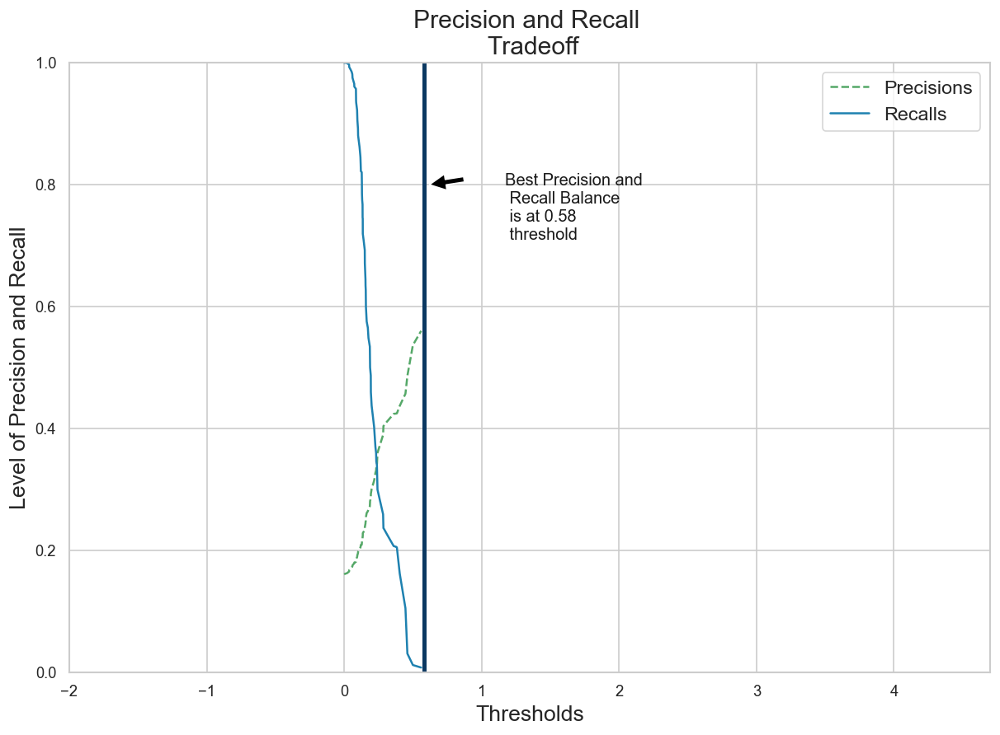

In [261]:
y_scores = dt_tuned.predict_proba(scaled_train)

if y_scores.ndim == 2:
    y_scores = y_scores[:, 1]
    
precisions, recalls, threshold = precision_recall_curve(y_train, y_scores,)
def precision_recall_curve(precisions, recalls, thresholds):
    fig, ax = plt.subplots(figsize=(12,8))
    plt.plot(thresholds, precisions[:-1], "g--", label="Precisions")
    plt.plot(thresholds, recalls[:-1], "#1e81b0", label="Recalls")
    plt.title("Precision and Recall \n Tradeoff", fontsize=18)
    plt.ylabel("Level of Precision and Recall", fontsize=16)
    plt.xlabel("Thresholds", fontsize=16)
    plt.legend(loc="best", fontsize=14)
    plt.xlim([-2, 4.7])
    plt.ylim([0, 1])
    plt.axvline(x=0.58, linewidth=3, color="#0B3861")
    plt.annotate('Best Precision and \n Recall Balance \n is at 0.58 \n threshold ', xy=(0.62, 0.80), xytext=(55, -40),
             textcoords="offset points",
            arrowprops=dict(facecolor='black', shrink=0.5),
                fontsize=12, 
                color='k')
    plt.show()
    
model.fit(x_train, y_train)

# Now you can call the export_text method
model.export_text()precision_recall_curve(precisions, recalls,threshold)

In [312]:
text_representation = tree.export_text(tree_model)
print('\033[1m'+'\033[92m'+text_representation)

|--- feature_4 <= 0.20
|   |--- feature_15 <= 0.99
|   |   |--- feature_9 <= 0.32
|   |   |   |--- feature_6 <= 0.89
|   |   |   |   |--- feature_9 <= 0.02
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_9 >  0.02
|   |   |   |   |   |--- feature_9 <= 0.26
|   |   |   |   |   |   |--- feature_0 <= 0.59
|   |   |   |   |   |   |   |--- feature_0 <= 0.32
|   |   |   |   |   |   |   |   |--- feature_14 <= 0.81
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- feature_14 >  0.81
|   |   |   |   |   |   |   |   |   |--- feature_1 <= 0.62
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |   |--- feature_1 >  0.62
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- feature_0 >  0.32
|   |   |   |   |   |   |   |   |--- feature_3 <= 0.35
|   |   |   |   |   |   |   |   |   |--- feature_3 <= 0.26
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |  

In [335]:
fig = plt.figure(figsize=(150,150))
_ = tree.plot_tree(dt_tuned, feature_names=feature_names,
                    class_names= ['yes','no'],
                   filled=True)

In [314]:
import pickle
filename = 'bank_model.h5'
pickle.dump(dt_tuned, open(filename, 'wb'))

In [315]:
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(x_test, y_test)
print("Model accuracy:", result)

Model accuracy: 0.839765564525047
